In [1]:
!pip install diffusers transformers accelerate --upgrade


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 77.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 83.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 83.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

In [2]:
from diffusers import StableDiffusionPipeline
import torch

pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

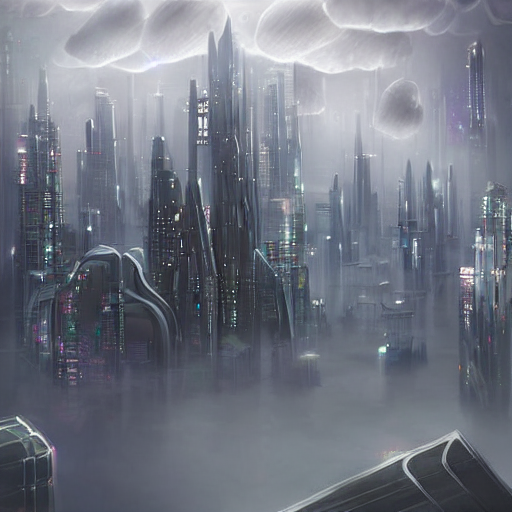

In [2]:
prompt = "A surreal futuristic city in the clouds, digital art"
image = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=7.5
).images[0]

# Mostrar inline en Colab
from PIL import Image
display(image)

# Guardar en disco
torch.cuda.empty_cache()
image.save("output.png")

  0%|          | 0/100 [00:00<?, ?it/s]

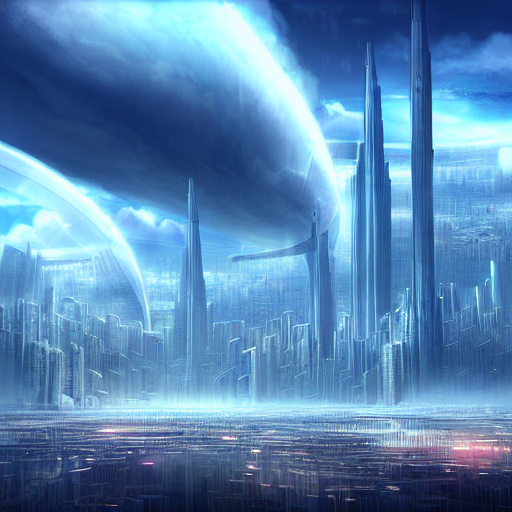

In [3]:
prompt = "A surreal futuristic city in the clouds, digital art"
image = pipe(
    prompt,
    num_inference_steps=100,
    guidance_scale=15
).images[0]

# Mostrar inline en Colab
from PIL import Image
display(image)

# Guardar en disco
torch.cuda.empty_cache()
image.save("output.png")

  0%|          | 0/20 [00:00<?, ?it/s]

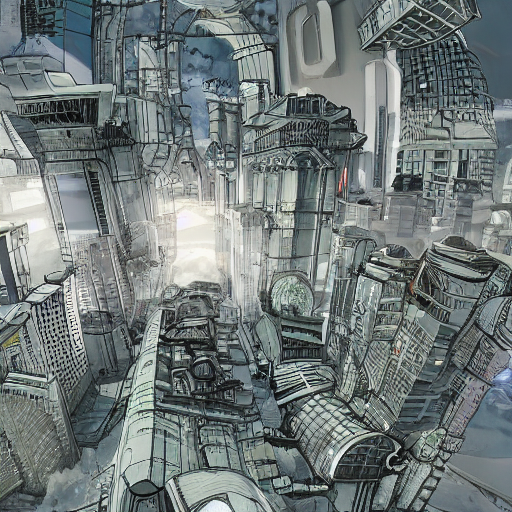

In [21]:
prompt = "A surreal futuristic city in the clouds, digital art"
image = pipe(
    prompt,
    num_inference_steps=20,
    guidance_scale=2.0
).images[0]

# Mostrar inline en Colab
from PIL import Image
display(image)

# Guardar en disco
torch.cuda.empty_cache()
image.save("output.png")

  0%|          | 0/50 [00:00<?, ?it/s]

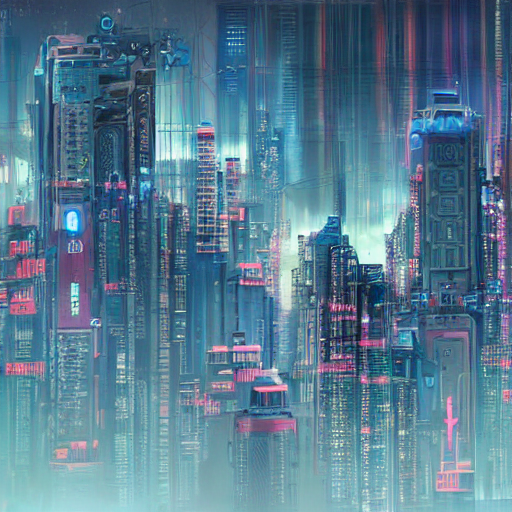

In [12]:
prompt = "A surreal cyberpunk city in the clouds, digital art"
generator = torch.Generator("cuda").manual_seed(1234)

# Llamada a pipe con generador
image = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=7.5,
    generator=generator  # aquí se pasa el generador con semilla fija
).images[0]

# Mostrar inline en Colab
from PIL import Image
display(image)

# Guardar en disco
torch.cuda.empty_cache()
image.save("output.png")

  0%|          | 0/50 [00:00<?, ?it/s]

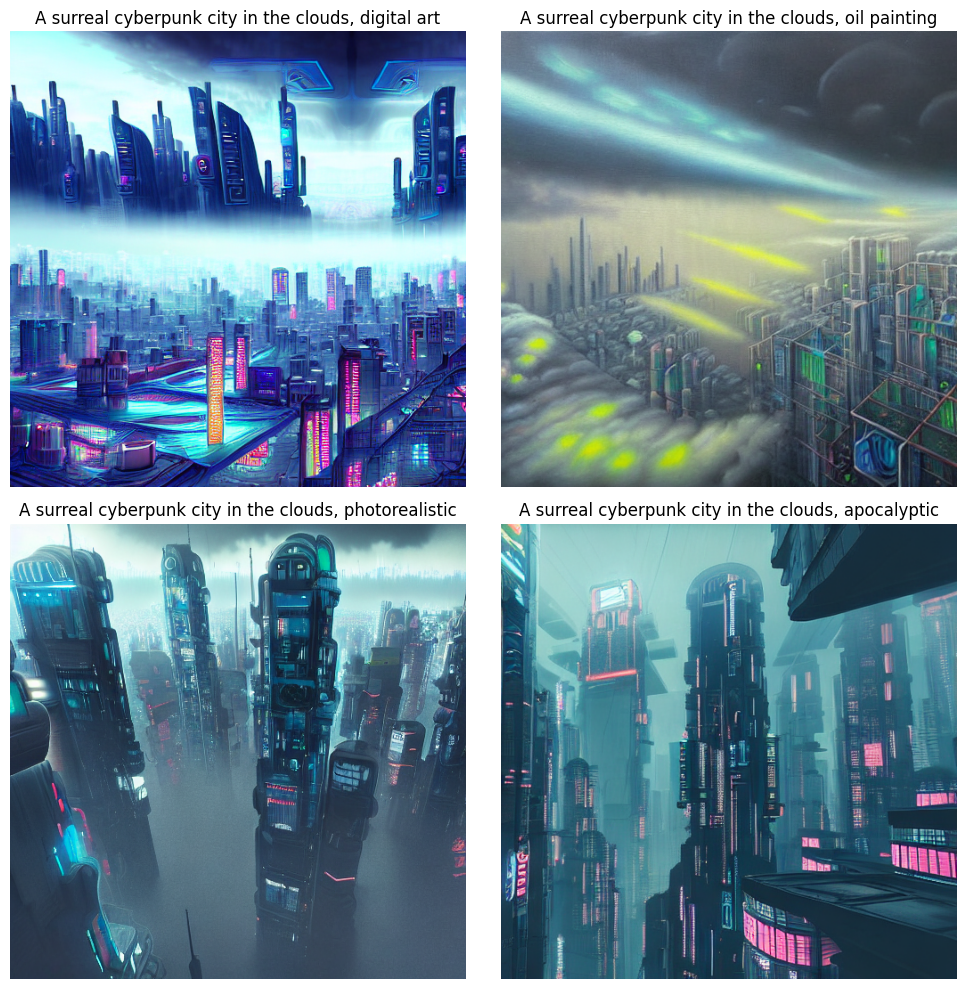

Guardada: combined_0.png
Guardada: combined_1.png
Guardada: combined_2.png
Guardada: combined_3.png


In [28]:
import matplotlib.pyplot as plt

# Definir la lista de prompts
prompts = [
    "A surreal cyberpunk city in the clouds, digital art",
    "A surreal cyberpunk city in the clouds, oil painting",
    "A surreal cyberpunk city in the clouds, photorealistic",
    "A surreal cyberpunk city in the clouds, apocalyptic"
]

# Generar todas las imágenes por lote
outputs = pipe(
    prompts,
    num_inference_steps=50,
    guidance_scale=15
)

# Mostrar en grilla 2x2
grid_size = (2, 2)
fig, axs = plt.subplots(*grid_size, figsize=(10,10))
for idx, (ax, img, prompt) in enumerate(zip(axs.flatten(), outputs.images, prompts)):
    ax.imshow(img)
    ax.set_title(prompt)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Guardar cada imagen
torch.cuda.empty_cache()
for i, img in enumerate(outputs.images):
    filename = f"combined_{i}.png"
    img.save(filename)
    print(f"Guardada: {filename}")

  0%|          | 0/50 [00:00<?, ?it/s]

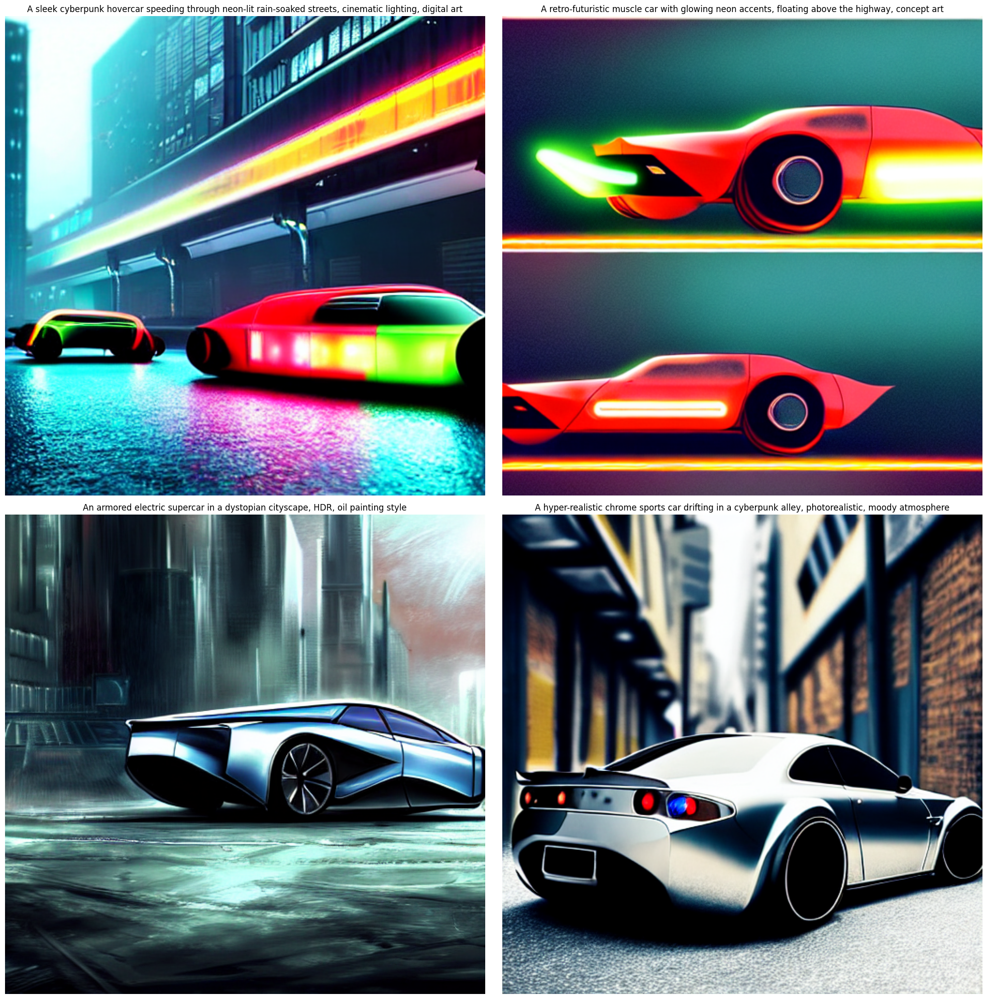

Guardada: carros_0.png
Guardada: carros_1.png
Guardada: carros_2.png
Guardada: carros_3.png


In [31]:
import matplotlib.pyplot as plt

# Definir la lista de prompts
prompts = [
    "A sleek cyberpunk hovercar speeding through neon-lit rain-soaked streets, cinematic lighting, digital art",
    "A retro-futuristic muscle car with glowing neon accents, floating above the highway, concept art",
    "An armored electric supercar in a dystopian cityscape, HDR, oil painting style",
    "A hyper-realistic chrome sports car drifting in a cyberpunk alley, photorealistic, moody atmosphere"
]

# Generar todas las imágenes por lote
outputs = pipe(
    prompts,
    num_inference_steps=50,
    guidance_scale=15
)

# Mostrar en grilla 2x2
grid_size = (2, 2)
fig, axs = plt.subplots(*grid_size, figsize=(20,20))
for idx, (ax, img, prompt) in enumerate(zip(axs.flatten(), outputs.images, prompts)):
    ax.imshow(img)
    ax.set_title(prompt)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Guardar cada imagen
torch.cuda.empty_cache()
for i, img in enumerate(outputs.images):
    filename = f"carros_{i}.png"
    img.save(filename)
    print(f"Guardada: {filename}")